# FUNCIONES DE AYUDA

In [ ]:
# definicion de las funciones de ayuda
def imShow(path):
  import cv2
  import matplotlib.pyplot as plt
  %matplotlib inline

  image = cv2.imread(path)
  height, width = image.shape[:2]
  resized_image = cv2.resize(image,(3*width, 3*height), interpolation = cv2.INTER_CUBIC)

  fig = plt.gcf()
  fig.set_size_inches(18, 10)
  plt.axis("off")
  plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
  plt.show()

# FUNCION PARA CARGAR ARCHIVOS DESDE EL COLAB
def upload():
  from google.colab import files
  uploaded = files.upload() 
  for name, data in uploaded.items():
    with open(name, 'wb') as f:
      f.write(data)
      print ('saved file', name)

# FUNCION PARA DESCARGAR ARCHIVOS DESDE EL COLAB 
def download(path):
  from google.colab import files
  files.download(path)

# ANÁLISIS DE DATOS

LECTURA DE DATOS / mediante OIDv4 se descargo el dataset con csv file e imagenes (4000) para train y (1000) para test

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from google.colab import files
import keras
from keras.models import Sequential 
from keras.layers import Dense 
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split

#uploaded = files.upload()
df = pd.read_csv('/content/drive/My Drive/OIDvTOOLKIT/OID/csv_folder/train-annotations-bbox.csv')

In [ ]:
df
#print(['train-annotations-bbox.csv'][:250].decode('utf-8') + '...')

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside
0,000002b66c9c498e,xclick,/m/01g317,1,0.012500,0.195312,0.148438,0.587500,0,1,0,0,0
1,000002b66c9c498e,xclick,/m/01g317,1,0.025000,0.276563,0.714063,0.948438,0,1,0,0,0
2,000002b66c9c498e,xclick,/m/01g317,1,0.151562,0.310937,0.198437,0.590625,1,0,0,0,0
3,000002b66c9c498e,xclick,/m/01g317,1,0.256250,0.429688,0.651563,0.925000,1,0,0,0,0
4,000002b66c9c498e,xclick,/m/01g317,1,0.257812,0.346875,0.235938,0.385938,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14610224,fffffdaec951185d,xclick,/m/0dzct,1,0.445625,0.672500,0.154784,0.200750,1,0,1,0,0
14610225,fffffdaec951185d,xclick,/m/0dzct,1,0.695625,0.786250,0.118199,0.297373,0,0,0,0,0
14610226,fffffdaec951185d,xclick,/m/0dzct,1,0.788750,0.835000,0.198874,0.272045,1,0,0,0,0
14610227,fffffdaec951185d,xclick,/m/0dzct,1,0.796875,0.951875,0.156660,0.205441,1,0,1,0,0


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fcdc631ec88>,
      dtype=object)

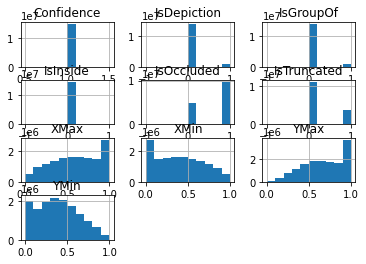

In [ ]:
df.hist()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from google.colab import files
import keras
from keras.models import Sequential 
from keras.layers import Dense 
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split

#uploaded = files.upload()

In [ ]:
df.isnull()

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside
0,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14610224,False,False,False,False,False,False,False,False,False,False,False,False,False
14610225,False,False,False,False,False,False,False,False,False,False,False,False,False
14610226,False,False,False,False,False,False,False,False,False,False,False,False,False
14610227,False,False,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
df2 = pd.read_csv('/content/drive/My Drive/OIDvTOOLKIT/OID/csv_folder/class-descriptions-boxable.csv')
df2

,/m/011k07,Tortoise
0,/m/011q46kg,Container
1,/m/012074,Magpie
2,/m/0120dh,Sea turtle
3,/m/01226z,Football
4,/m/012n7d,Ambulance
...,...,...
595,/m/0qmmr,Wheelchair
596,/m/0wdt60w,Rugby ball
597,/m/0xfy,Armadillo
598,/m/0xzly,Maracas


In [ ]:
df2.isnull

<bound method DataFrame.isnull of        /m/011k07    Tortoise
0    /m/011q46kg   Container
1      /m/012074      Magpie
2      /m/0120dh  Sea turtle
3      /m/01226z    Football
4      /m/012n7d   Ambulance
..           ...         ...
595     /m/0qmmr  Wheelchair
596   /m/0wdt60w  Rugby ball
597      /m/0xfy   Armadillo
598     /m/0xzly     Maracas
599     /m/0zvk5      Helmet

[600 rows x 2 columns]>

# RED NEURONAL (ESPECIFICACIONES Y ENTRENAMIENTO)

TRAIN

Para crear un detector YOLOv3 personalizado necesitaremos lo siguiente: 



*   >Conjunto de datos personalizados etiquetados
*   >Archivo .cfg personalizado 
*   >Archivos obj.data y obj.names
*   >archivo train.txt (test.txt también es opcional aquí)
 


el dataset se lo genera a partir del OIDv4 ToolKit, en base al dataset de google images como se menciona anteriormente, además se procede a:

TRASLADAR DEL CONJUNTO DE DATOS PERSONALIZADO A LA VM DE LA NUBE

In [ ]:
# aquí es donde se almacena mi zip (creé una carpeta yolov3 de donde obtendré mis archivos requeridos)
!ls /mydrive/yolov3

backup	generate_train.py  obj.data  obj.names	obj.zip  yolov3_custom.cfg


In [ ]:
# copie el archivo .zip en el directorio raíz de la máquina virtual en la nube
!cp /mydrive/yolov3/obj.zip /content/

In [ ]:
# descomprimo el archivo zip y su contenido, ahora debería estar en /darknet/data/obj
!unzip ../obj.zip -d data/

Archive:  ../obj.zip
  inflating: data/obj/00b7cc8f42d0c10a.jpg  
  inflating: data/obj/00b7cc8f42d0c10a.txt  
  inflating: data/obj/0204c215b898233a.jpg  
  inflating: data/obj/0204c215b898233a.txt  
  inflating: data/obj/03324558464cbdd1.jpg  
  inflating: data/obj/03324558464cbdd1.txt  
  inflating: data/obj/03448404bf49e2cb.jpg  
  inflating: data/obj/03448404bf49e2cb.txt  
  inflating: data/obj/034e5e2b573bed6a.jpg  
  inflating: data/obj/034e5e2b573bed6a.txt  
  inflating: data/obj/03e6e37476a80f35.jpg  
  inflating: data/obj/03e6e37476a80f35.txt  
  inflating: data/obj/0423423f59cf4762.jpg  
  inflating: data/obj/0423423f59cf4762.txt  
  inflating: data/obj/04299d8cd7c8518b.jpg  
  inflating: data/obj/04299d8cd7c8518b.txt  
  inflating: data/obj/0458c57509830cc4.jpg  
  inflating: data/obj/0458c57509830cc4.txt  
  inflating: data/obj/04e9f38904b8fa3f.jpg  
  inflating: data/obj/04e9f38904b8fa3f.txt  
  inflating: data/obj/05e8b5e1832f1c5f.jpg  
  inflating: data/obj/05e8b5e1832f

Configurar archivos para entrenamiento

In [ ]:
# download cfg to google drive and change its name
!cp /cfg/yolov3.cfg /mydrive/yolov3/yolov3_custom1.cfg

cp: cannot stat '/cfg/yolov3.cfg': No such file or directory


In [ ]:
# to download to local machine (change its name to yolov3_custom.cfg once you download)
download('cfg/yolov3_custom.cfg')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

actualizamos el archivo editado en base a las necesidades del nuevo problema

In [ ]:
# upload the custom .cfg back to cloud VM from Google Drive
!cp /mydrive/yolov3/yolov3_custom.cfg ./cfg

# upload the custom .cfg back to cloud VM from local machine (uncomment to use)
#%cd cfg
#upload()
#%cd .. 

se crean los archivos obj.names el cual toma los identificadores de cada box de deteccion y obj.data donde se cambia el numero de clases que se tiene en el entrenamiento

In [ ]:
# upload the obj.names and obj.data files to cloud VM from Google Drive
!cp /mydrive/yolov3/obj.names ./data
!cp /mydrive/yolov3/obj.data  ./data

# upload the obj.names and obj.data files to cloud VM from local machine (uncomment to use)
#%cd data
#upload()
#%cd .. 

GENERAR Train.txt

In [ ]:
# upload the generate_train.py script to cloud VM from Google Drive
!cp /mydrive/yolov3/generate_train.py ./

# upload the generate_train.py script to cloud VM from local machine (uncomment to use)
#upload()


Ahora simplemente ejecutamos el script de Python para hacer todo el trabajo por nosotros.

In [ ]:
!pwd

/content/darknet


In [ ]:
!python generate_train.py

In [ ]:
# verify train.txt can be seen in our darknet/data folder
!ls data/

9k.tree     eagle.jpg	 imagenet.labels.list	   openimages.names  voc.names
coco9k.map  giraffe.jpg  imagenet.shortnames.list  person.jpg
coco.names  goal.txt	 labels			   scream.jpg
dog.jpg     horses.jpg	 obj			   train.txt


Descargar pesos pre-entrenados para las capas convolucionales

In [ ]:
# upload pretrained convolutional layer weights
!wget http://pjreddie.com/media/files/darknet53.conv.74

--2020-07-30 09:58:46--  http://pjreddie.com/media/files/darknet53.conv.74
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://pjreddie.com/media/files/darknet53.conv.74 [following]
--2020-07-30 09:58:46--  https://pjreddie.com/media/files/darknet53.conv.74
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 162482580 (155M) [application/octet-stream]
Saving to: ‘darknet53.conv.74’

darknet53.conv.74   100%[===================>] 154.96M   160KB/s    in 21m 51s 

2020-07-30 10:20:40 (121 KB/s) - ‘darknet53.conv.74’ saved [162482580/162482580]



Entrenamiento del detector de objetos personalizado

In [ ]:
# train your custom detector
!./darknet detector train data/obj.data cfg/yolov3_custom.cfg darknet53.conv.74 -dont_show

Se truncaron las últimas líneas 5000 del resultado de transmisión.
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.000457, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.000127, iou_loss = 0.000000, total_loss = 0.000127 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.000230, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.000147, iou_loss = 0.000000, total_loss = 0.000147 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.000096, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.000110, iou_loss = 0.000000, total_loss = 0.000110 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.000447, .5R: 0.000000, .75R: 0.0

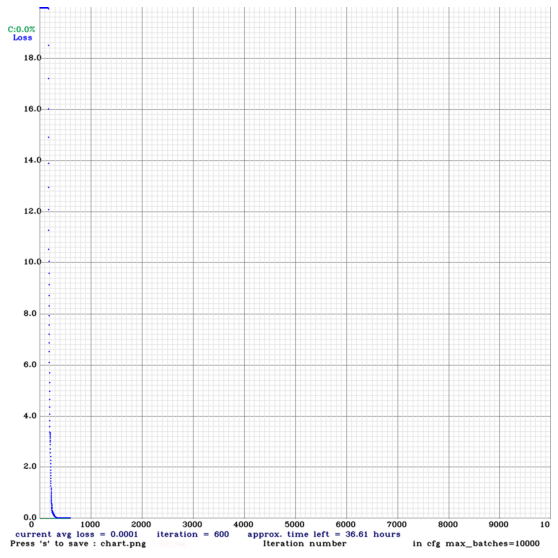

In [ ]:
imShow('chart.png')

si se interrumpe por alguna ocasion se ejecuta el siguiente código para reanudar desde el backup folder (*.weights salvado)

In [ ]:
!./darknet detector train data/obj.data cfg/yolov3_custom.cfg /mydrive/yolov3/backup/yolov3_custom_last.weights -dont_show

AHORA EN BASE AL ANALISIS PREVIO REALIZADO EN LA PRIMERA PARTE SE PROCEDE A INCORPORAR EL MODELO PREIAMENTE CUSTOMIZADO, CON LOS PESOS REALIZADOS DE MANERA PROPIA SIGUIENDO EL ESTANDAR DE YOLO, PARA QUE JUNTAMENTE CON EL FRAMEWORK DE YOLOACT BASADO EN EL MISMO YOLO LO CUAL FORTALECE EL MODELO CREADO Y SE ANCLA DEL MODELO QUE YOLOACT PRESTA EN BASE A SUS CAPAS 

# Setup Inicial
Primero, instalamos algunas bibliotecas de Python. Es probable que Google Colab ya tenga estos requisitos, pero es mejor incluirlos

In [ ]:

!pip install cython
!pip install opencv-python pillow pycocotools matplotlib

In [ ]:
# Adaptacion a DCNv2
!pip install torchvision==0.5.0
!pip install torch==1.9.0


     |████████████████████████████████| 4.0 MB 9.3 MB/s 
     |████████████████████████████████| 753.4 MB 7.1 kB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.9.0+cu102
    Uninstalling torch-1.9.0+cu102:
      Successfully uninstalled torch-1.9.0+cu102
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.10.0+cu102
    Uninstalling torchvision-0.10.0+cu102:
      Successfully uninstalled torchvision-0.10.0+cu102
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.10.0 requires torch==1.9.0, but you have torch 1.4.0 which is incompatible.


## Clonar YOLOACT desde Github
Let's get that github repo! If anything in this notebook breaks, check the repo in case they've made updates.

In [ ]:
# Make sure we're in the top folder
%cd /content

# Clone the repo
!git clone https://github.com/dbolya/yolact.git

/content
Cloning into 'yolact'...
remote: Enumerating objects: 2936, done.
remote: Total 2936 (delta 0), reused 0 (delta 0), pack-reused 2936
Receiving objects: 100% (2936/2936), 21.20 MiB | 26.10 MiB/s, done.
Resolving deltas: 100% (2003/2003), done.


## DCNv2

In [ ]:
# Change to the right directory
%cd /content/yolact/external/DCNv2

# Build DCNv2
!python setup.py build develop

/content/yolact/external/DCNv2
running build
running build_ext
building '_ext' extension
creating build
creating build/temp.linux-x86_64-3.7
creating build/temp.linux-x86_64-3.7/content
creating build/temp.linux-x86_64-3.7/content/yolact
creating build/temp.linux-x86_64-3.7/content/yolact/external
creating build/temp.linux-x86_64-3.7/content/yolact/external/DCNv2
creating build/temp.linux-x86_64-3.7/content/yolact/external/DCNv2/src
creating build/temp.linux-x86_64-3.7/content/yolact/external/DCNv2/src/cpu
creating build/temp.linux-x86_64-3.7/content/yolact/external/DCNv2/src/cuda
x86_64-linux-gnu-gcc -pthread -Wno-unused-result -Wsign-compare -DNDEBUG -g -fwrapv -O2 -Wall -g -fdebug-prefix-map=/build/python3.7-LSlbJj/python3.7-3.7.11=. -fstack-protector-strong -Wformat -Werror=format-security -g -fdebug-prefix-map=/build/python3.7-LSlbJj/python3.7-3.7.11=. -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2 -fPIC -DWITH_CUDA -I/content/yolact/exte

## Pesos Pre-Entrenados
Mediante Github se obtienen unos pesos pre-entrenados en base a REST, NET y DARKNET, en este caso se manipula los pesos directos de YOLOACT y el customizado desde el modelo anterior expuesto anteriormente.

In [ ]:
# Make sure we're in the top folder
%cd /content

# Clone the repo
!git clone https://github.com/chentinghao/download_google_drive.git

# Create a new directory for the pre-trained weights
!mkdir -p /content/yolact/weights

# Download the file
!python ./download_google_drive/download_gdrive.py 1ZPu1YR2UzGHQD0o1rEqy-j5bmEm3lbyP ./yolact/weights/yolact_plus_resnet50_54_800000.pth

/content
Cloning into 'download_google_drive'...
remote: Enumerating objects: 16, done.
remote: Total 16 (delta 0), reused 0 (delta 0), pack-reused 16
Unpacking objects: 100% (16/16), done.
129MB [00:00, 158MB/s]


# Testeo de Imagenes
Desde [COCO dataset](http://cocodataset.org/#explore). descargamos una imagenes de prueba, en donde se utiliza imagenes sin modificación alguna, ya que antes se utilizo el toolkit se OIDv4 en donde ya viene con las boxes y demás caracteristicas

In [ ]:
# nuevo directorio
!mkdir /content/test_images

# ir al directorio
%cd /content/test_images

# lista de imagenes del COCO dataset
get_imgs = ['http://farm8.staticflickr.com/7158/6798295817_30afdffdfb_z.jpg',
            'http://farm9.staticflickr.com/8320/8018419349_7cfb9dacf3_z.jpg',
            'http://farm3.staticflickr.com/2066/2070702315_7ce139edfe_z.jpg',
            'http://farm4.staticflickr.com/3070/3023571869_9fe39b0d59_z.jpg',
            'http://farm4.staticflickr.com/3051/2560965194_bac589722d_z.jpg',
            'http://farm8.staticflickr.com/7133/7844113938_d2961f2f19_z.jpg',
            'http://farm9.staticflickr.com/8022/7685725760_9343f56ed5_z.jpg',
            'http://farm8.staticflickr.com/7025/6839677447_8e4273eb28_z.jpg']

# Descargamos las imagenes
for img_url in get_imgs:
  !wget {img_url} -nc

# Listamos el contenido del directorio para comprobar la salida de las imagenes.
!pwd
!ls

mkdir: cannot create directory ‘/content/test_images’: File exists
/content/test_images
--2021-07-27 05:09:27--  http://farm8.staticflickr.com/7158/6798295817_30afdffdfb_z.jpg
Resolving farm8.staticflickr.com (farm8.staticflickr.com)... 52.84.182.78, 2600:9000:20be:1400:0:5a51:64c9:c681, 2600:9000:20be:a800:0:5a51:64c9:c681, ...
Connecting to farm8.staticflickr.com (farm8.staticflickr.com)|52.84.182.78|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://farm8.staticflickr.com/7158/6798295817_30afdffdfb_z.jpg [following]
--2021-07-27 05:09:27--  https://farm8.staticflickr.com/7158/6798295817_30afdffdfb_z.jpg
Connecting to farm8.staticflickr.com (farm8.staticflickr.com)|52.84.182.78|:443... connected.
HTTP request sent, awaiting response... 404 Not Found
2021-07-27 05:09:27 ERROR 404: Not Found.

--2021-07-27 05:09:27--  http://farm9.staticflickr.com/8320/8018419349_7cfb9dacf3_z.jpg
Resolving farm9.staticflickr.com (farm9.staticflickr.com)...

# Se ejecuta el modelo con la configuración de YOLOACT++
Se realiza en base a una configuracion Default juntamente con el archivo de pesos preentrenados expuestos anteriormente

In [ ]:
# ir al directorio content
%cd /content

# borramos toda prediccion anteriormente hecha
!rm /content/output_images -r

# creamos el directorio para la salida de las imagenes
!mkdir -p /content/output_images

# ejecutamos el modelo de YOLOACT en el directorio de salida creado anteriormente
!python ./yolact/eval.py --trained_model=./yolact/weights/yolact_plus_resnet50_54_800000.pth --config=yolact_plus_resnet50_config --score_threshold=0.15 --top_k=15 --images=test_images:output_images

/content
Loading model... Done.

test_images/7844113938_d2961f2f19_z.jpg -> output_images/7844113938_d2961f2f19_z.png
test_images/7705349298_6bea29cf1c_z.jpg -> output_images/7705349298_6bea29cf1c_z.png
test_images/2070702315_7ce139edfe_z.jpg -> output_images/2070702315_7ce139edfe_z.png
test_images/2560965194_bac589722d_z.jpg -> output_images/2560965194_bac589722d_z.png
test_images/101757885_a8fc40e273_z.jpg -> output_images/101757885_a8fc40e273_z.png
test_images/3897535041_fa8dd5570b_z.jpg -> output_images/3897535041_fa8dd5570b_z.png
test_images/9520716824_51220b13d0_z.jpg -> output_images/9520716824_51220b13d0_z.png
test_images/3023571869_9fe39b0d59_z.jpg -> output_images/3023571869_9fe39b0d59_z.png
test_images/6946559805_7edf757660_z.jpg -> output_images/6946559805_7edf757660_z.png
test_images/7685725760_9343f56ed5_z.jpg -> output_images/7685725760_9343f56ed5_z.png
test_images/10105052924_0c8d79e62c_z.jpg -> output_images/10105052924_0c8d79e62c_z.png
test_images/6839677447_8e4273eb2

## Imagenes de salido post testeo
Desplegamos las imagenes de entrada en donde se genera la segmentacion semantica medinate el modelo de YOLOACT++

output_images/2070702315_7ce139edfe_z.png


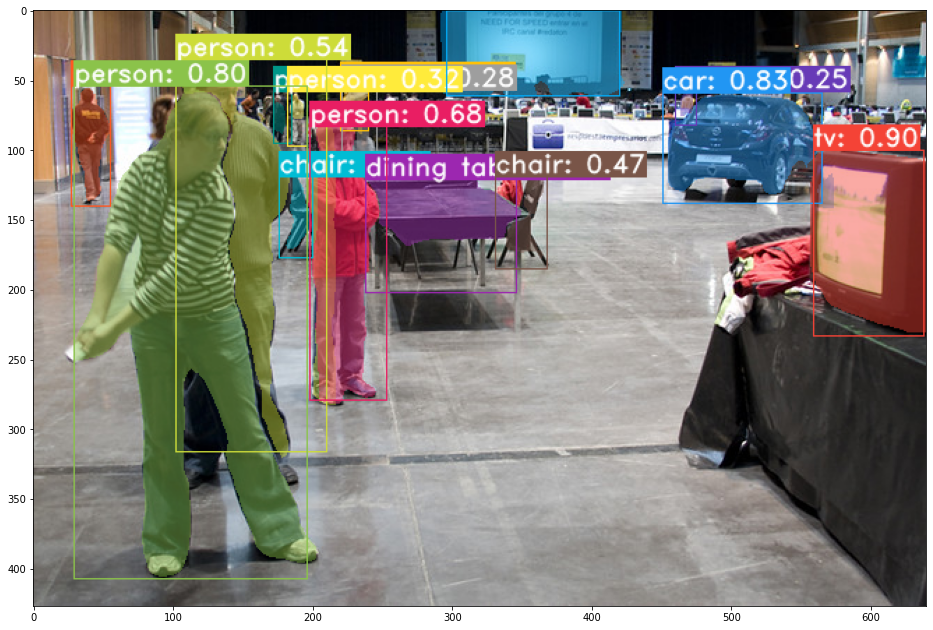

output_images/3897535041_fa8dd5570b_z.png


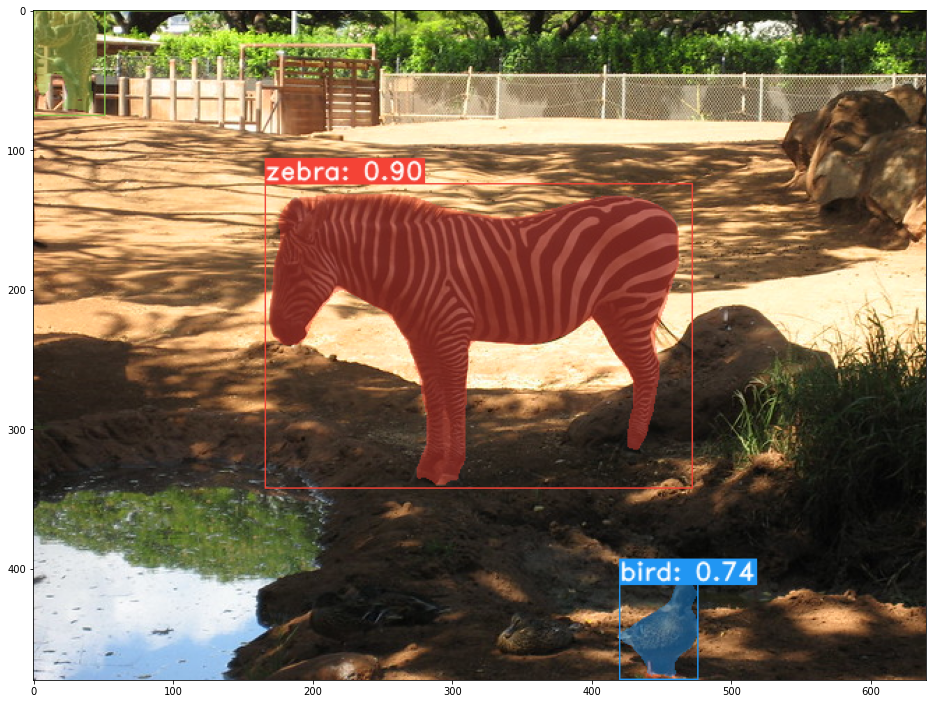

output_images/6839677447_8e4273eb28_z.png


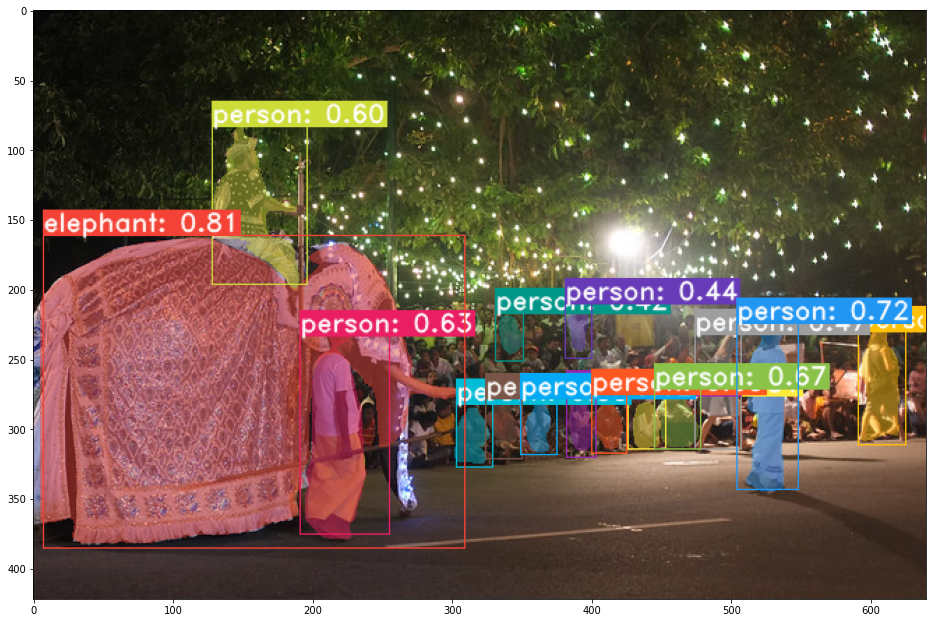

output_images/7844113938_d2961f2f19_z.png


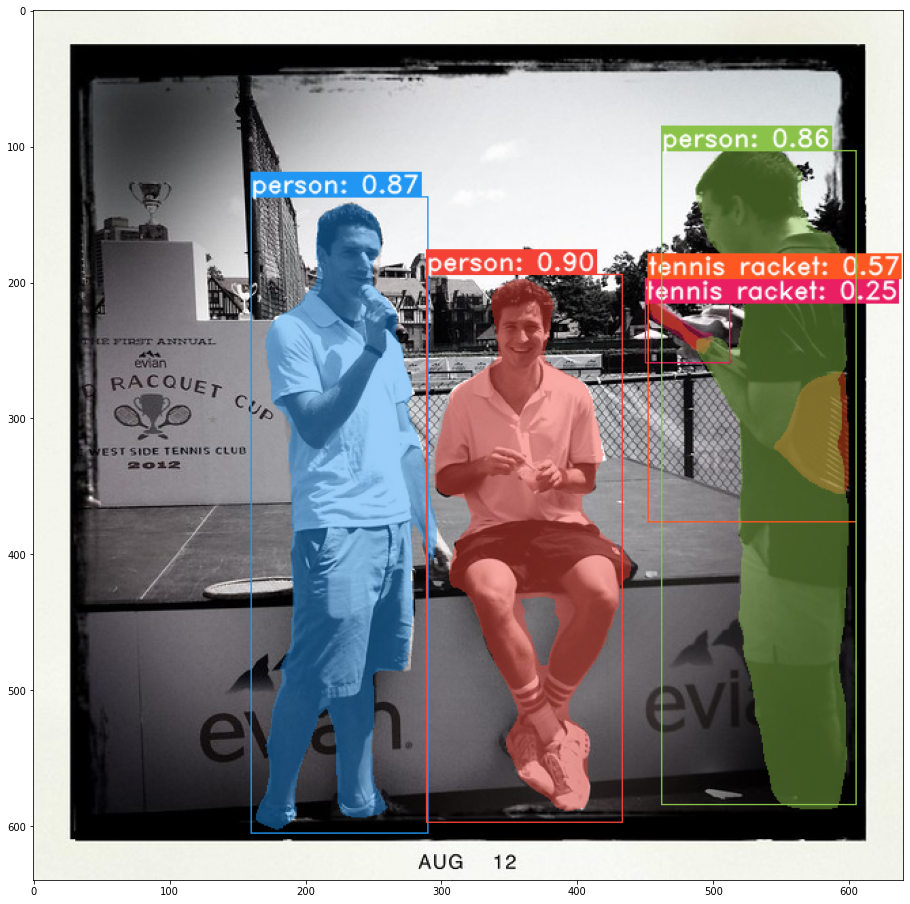

output_images/7705349298_6bea29cf1c_z.png


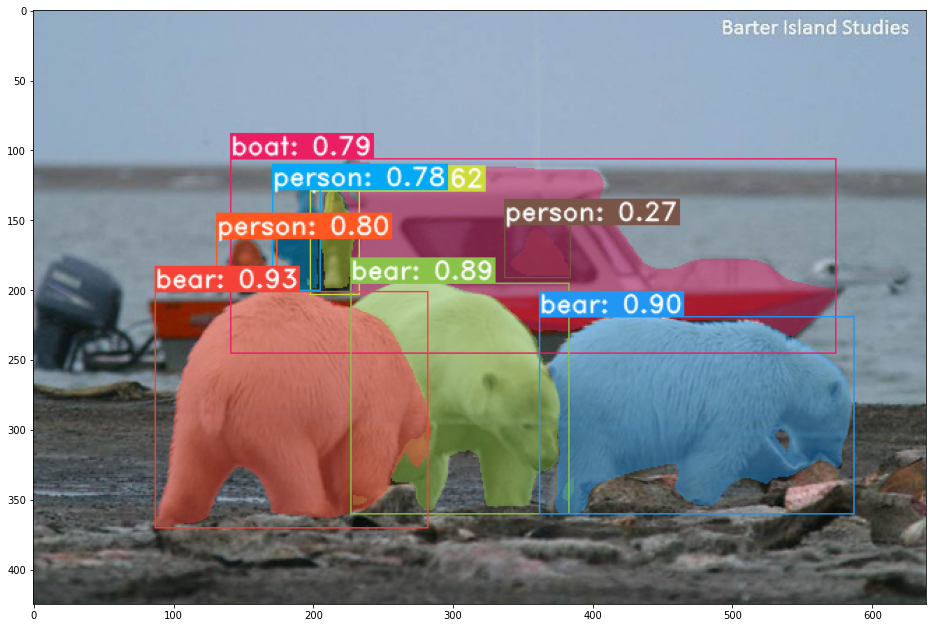

output_images/7685725760_9343f56ed5_z.png


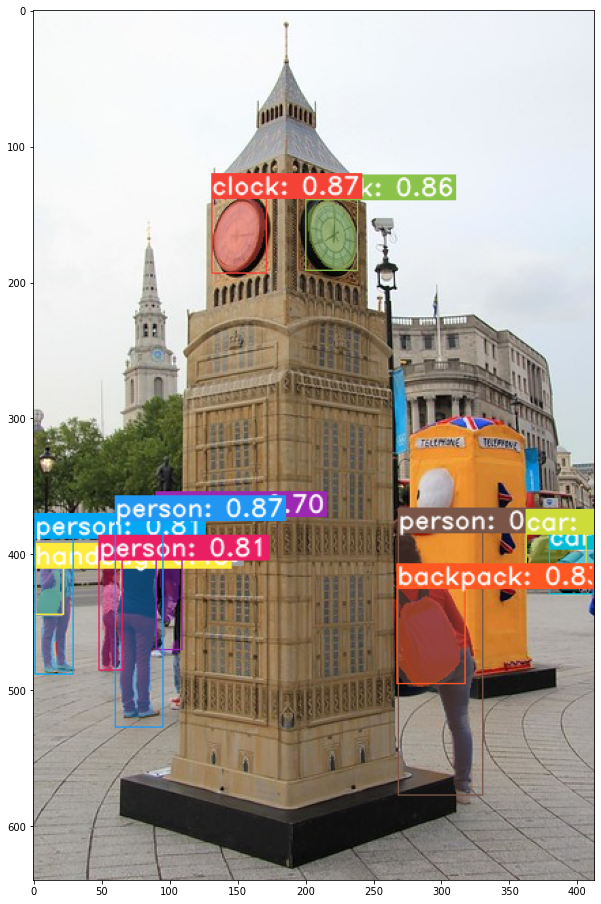

output_images/10105052924_0c8d79e62c_z.png


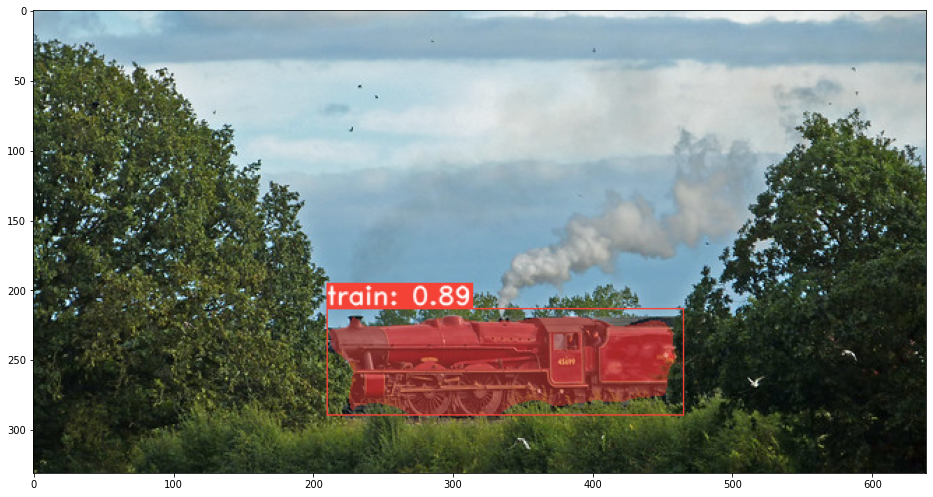

output_images/4981945644_3f162314ed_z.png


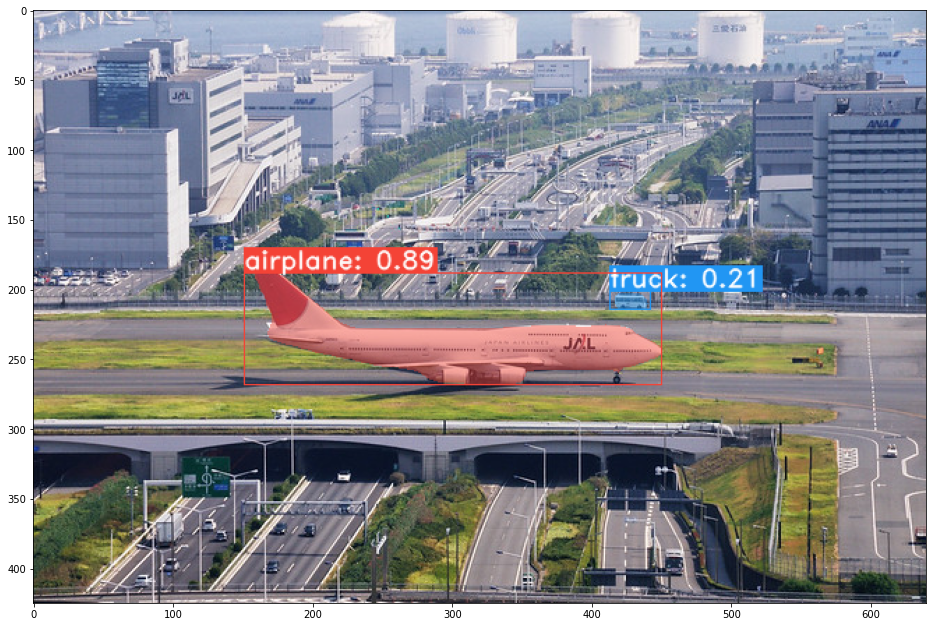

output_images/2560965194_bac589722d_z.png


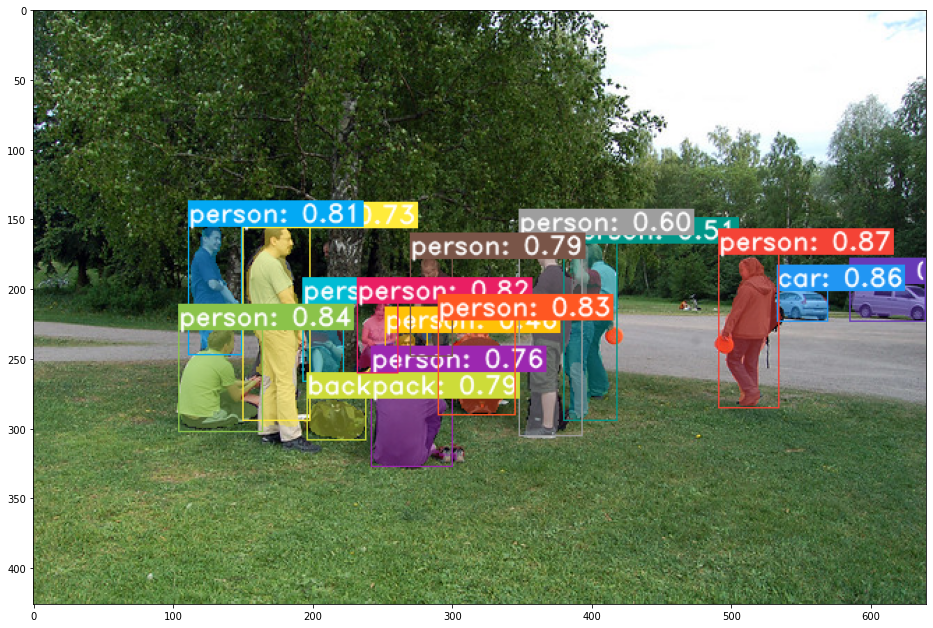

output_images/3679968895_37a79e55b3_z.png


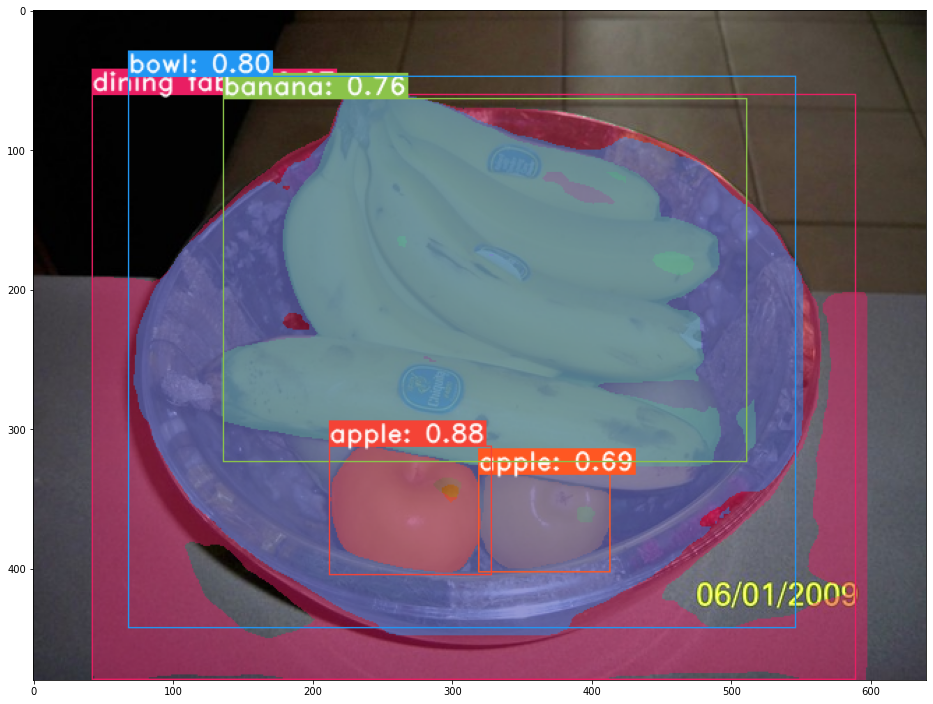

output_images/6946559805_7edf757660_z.png


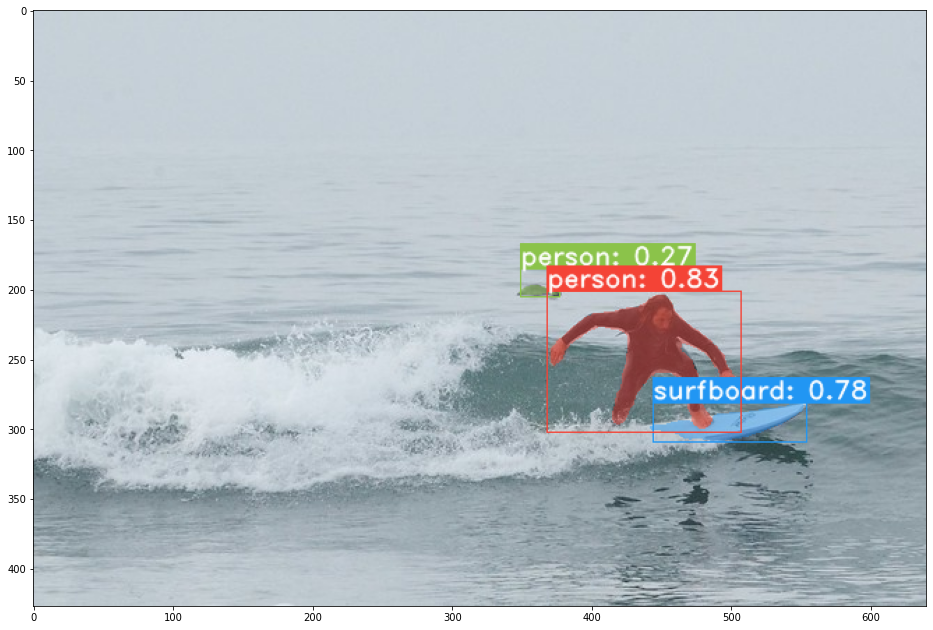

output_images/9520716824_51220b13d0_z.png


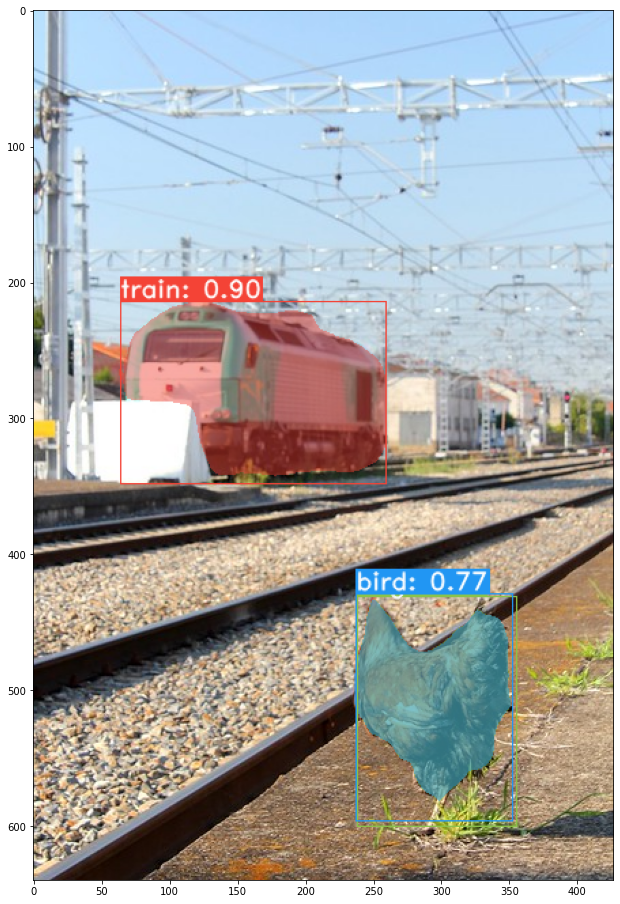

output_images/101757885_a8fc40e273_z.png


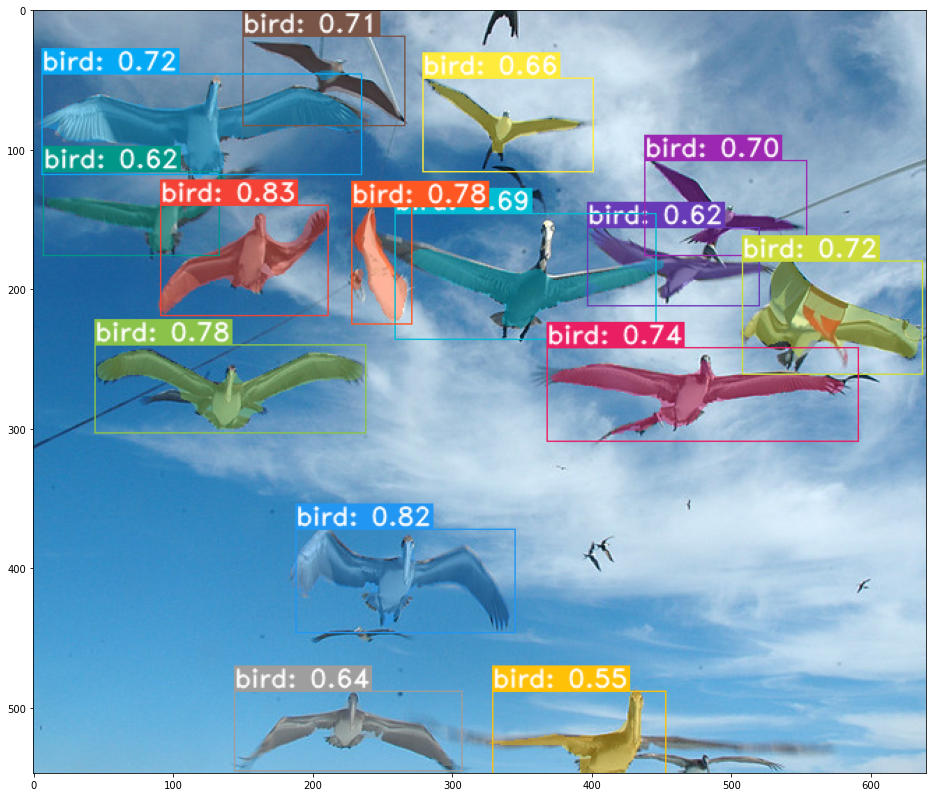

output_images/3023571869_9fe39b0d59_z.png


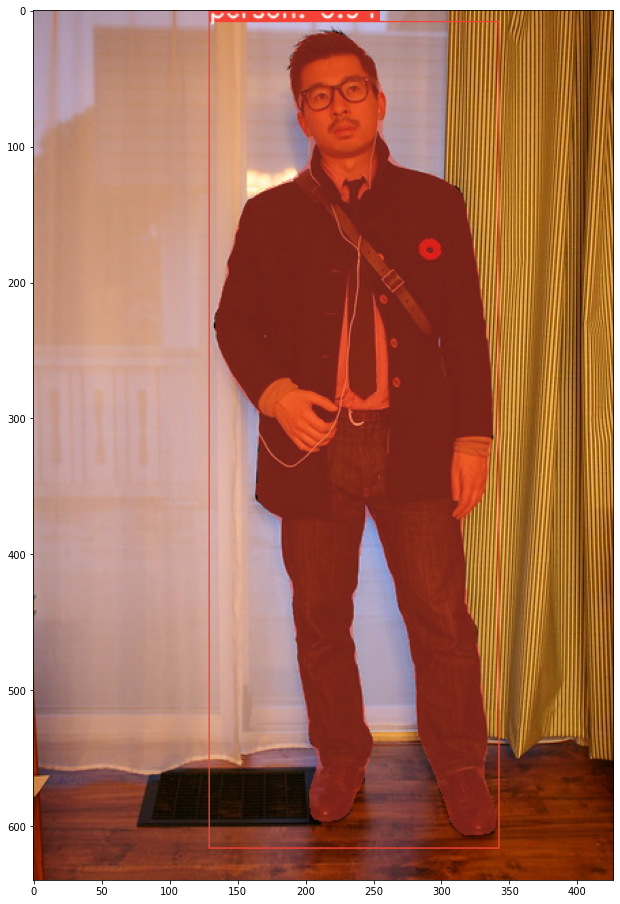

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from pathlib import Path

output_images = Path('output_images')

def show_image(img_path):
  img = cv2.imread(img_path)
  img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  plt.figure(figsize=(16,16))
  plt.imshow(img_cvt)
  plt.show()

# Iterate through all of the output images and display them
for img_path in output_images.iterdir():
  print(img_path)
  show_image(str(img_path))

# Ejecutar modelo en video



**PENDIENTE ...!!!**

Se implementa la lógica para añadir un video al modelo

In [ ]:
# Make a new directory for the test images
!mkdir -p /content/test_video

# Move to the top level directory
%cd /content

# Download the file
# https://drive.google.com/file/d/1zwOp-PH_c1V_CATZ_g7XAYc0JHt2XF4C/view?usp=sharing
# Note that file_id is extracted from the share URL above, it'll be different for every file
file_id = "1zwOp-PH_c1V_CATZ_g7XAYc0JHt2XF4C"
file_path = "/content/test_video/pedestrians.mp4" # <- this is the destination path

!python /content/download_google_drive/download_gdrive.py {file_id} {file_path}

!ls /content/test_video

/content
6.38MB [00:00, 38.6MB/s]
pedestrians.mp4


Se testea el modelo en base al video descargado previamente

In [ ]:
%cd /content
!mkdir -p /content/output_videos
output_path = "/content/output_videos/pedestrians_output.mp4"
!python ./yolact/eval.py --trained_model=./yolact/weights/yolact_plus_resnet50_54_800000.pth --score_threshold=0.15 --top_k=15 --video_multiframe=4 --video={file_path}:{output_path}

/content
Config not specified. Parsed yolact_plus_resnet50_config from the file name.

Loading model... Done.
Initializing model... Done.

Traceback (most recent call last):
  File "./yolact/eval.py", line 1105, in <module>
    evaluate(net, dataset)
  File "./yolact/eval.py", line 890, in evaluate
    evalvideo(net, inp, out)
  File "./yolact/eval.py", line 832, in evalvideo
    frame_buffer.put(frame['value'].get())
  File "/usr/lib/python3.7/multiprocessing/pool.py", line 657, in get
    raise self._value
  File "/usr/lib/python3.7/multiprocessing/pool.py", line 121, in worker
    result = (True, func(*args, **kwds))
  File "./yolact/eval.py", line 712, in prep_frame
    return prep_display(preds, frame, None, None, undo_transform=False, class_color=True, fps_str=fps_str)
  File "./yolact/eval.py", line 155, in prep_display
    idx = t[1].argsort(0, descending=True)[:args.top_k]
AttributeError: 'list' object has no attribute 'argsort'


**LA PARTE DEL VIDEO AUN NO CONSTA CON UN FORMATO CORRECTO POR LO QUE EXISTEN ERRORES EN SU OUTPUT ...!!!!!**